<a href="https://colab.research.google.com/github/Dohyeon-Kim1/Object-Background_StyleTransfer_withText/blob/sooking87/week3/Mask_R_CNN_Pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


[Mask R-CNN for Instance Segmentation Using Pytorch](https://www.analyticsvidhya.com/blog/2023/02/mask-r-cnn-for-instance-segmentation-using-pytorch/) <br>
[Mask RCNN Pytorch – Instance Segmentation](https://learnopencv.com/mask-r-cnn-instance-segmentation-with-pytorch/) <br>
[How do I Download COCO dataset](https://colab.research.google.com/drive/1QuLLsvX-DnOcOVWxcKWglIzDnxV_OHxE?usp=sharing#scrollTo=2o3XJYx-xsx-)

## Load COCO dataset

In [ ]:
!pip install CocoDataset==0.1.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!wget http://images.cocodataset.org/annotations/annotations_trainval2014.zip

--2023-04-07 09:22:32--  http://images.cocodataset.org/annotations/annotations_trainval2014.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.120.33, 52.217.168.249, 52.216.21.211, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.120.33|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252872794 (241M) [application/zip]
Saving to: ‘annotations_trainval2014.zip.2’

annotations_trainva 100%[===================>] 241.16M  58.4MB/s    in 4.0s    

2023-04-07 09:22:36 (60.1 MB/s) - ‘annotations_trainval2014.zip.2’ saved [252872794/252872794]



In [ ]:
!unzip /content/gdrive/MyDrive/annotations_trainval2014.zip

Archive:  /content/gdrive/MyDrive/annotations_trainval2014.zip
  inflating: annotations/instances_train2014.json  
  inflating: annotations/instances_val2014.json  
  inflating: annotations/person_keypoints_train2014.json  
  inflating: annotations/person_keypoints_val2014.json  
  inflating: annotations/captions_train2014.json  
  inflating: annotations/captions_val2014.json  


In [ ]:
from coco_dataset import coco_dataset_download as cocod
class_name='person'  #class name 
images_count=50       #count of images  
annotations_path='/content/gdrive/MyDrive/annotations/instances_train2014.json' #path of coco dataset annotations 
#call download function
cocod.coco_dataset_download(class_name,images_count,annotations_path)

loading annotations into memory...
Done (t=16.68s)
creating index...
index created!


FileExistsError: ignored

## Set Path

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
import os
os.chdir('/content/gdrive/MyDrive')

## Load Mask R-CNN Pretrained Model

In [ ]:
# import the necessary package and define a utility function
import torch
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
device = torch.device('cuda')

In [ ]:
# Model loading
from torchvision.models.detection import maskrcnn_resnet50_fpn, MaskRCNN_ResNet50_FPN_Weights
import torchvision

model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
model.eval()

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:01<00:00, 94.5MB/s]


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [ ]:
# prediction of the Model
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

In [ ]:
from PIL import Image
import torchvision.transforms as T
import random
import cv2
import matplotlib.pyplot as plt

def get_prediction(img_path, threshold):
  img = Image.open(img_path)
  # converted to image tensor using PyTorch's transform
  transform = T.Compose([T.ToTensor()]) 
  img = transform(img)
  # passing image to model
  pred = model([img])
  # make return value: masks, pred_boxes, pred_class
  pred_score = list(pred[0]['scores'].detach().numpy())
  pred_t = [pred_score.index(x) for x in pred_score if x > threshold][-1]
  masks = (pred[0]['masks'] > 0.5).squeeze().detach().cpu().numpy()
  pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
  pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().numpy())]
  masks = masks[:pred_t+1]
  pred_boxes = pred_boxes[:pred_t+1]
  pred_class = pred_class[:pred_t+1]
  return masks, pred_boxes, pred_class

# The masks of each predicted object is given random colour from a set of 11 predefined colours for visualization of the masks
def random_colour_masks(image):
  colours = [[0, 255, 0],[0, 0, 255],[255, 0, 0],[0, 255, 255],[255, 255, 0],[255, 0, 255],[80, 70, 180],[250, 80, 190],[245, 145, 50],[70, 150, 250],[50, 190, 190]]
  r = np.zeros_like(image).astype(np.uint8)
  g = np.zeros_like(image).astype(np.uint8)
  b = np.zeros_like(image).astype(np.uint8)
  r[image == 1], g[image == 1], b[image == 1] = colours[random.randrange(0, 10)]
  coloured_mask = np.stack([r, g, b], axis=2)
  return coloured_mask

# instance_segmentation
def instance_segmentation_api(img_path, threshold=0.5, rect_th=1, text_size=0.4, text_th=1):
  masks, boxes, pred_cls = get_prediction(img_path, threshold)
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  for i in range(len(masks)):
    rgb_mask = random_colour_masks(masks[i])
    img = cv2.addWeighted(img, 1, rgb_mask, 0.5, 0)
    c1, c2 = (int(boxes[i][0][0]), int(boxes[i][0][1])), (int(boxes[i][1][0]), int(boxes[i][1][1]))
    cv2.rectangle(img, c1, c2, color=(0, 255, 0), thickness=rect_th)
    cv2.putText(img, pred_cls[i], c1, cv2.FONT_HERSHEY_SIMPLEX, text_size, (0, 255, 0), thickness=text_th)
  plt.figure(figsize=(20, 20))
  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])
  plt.show()

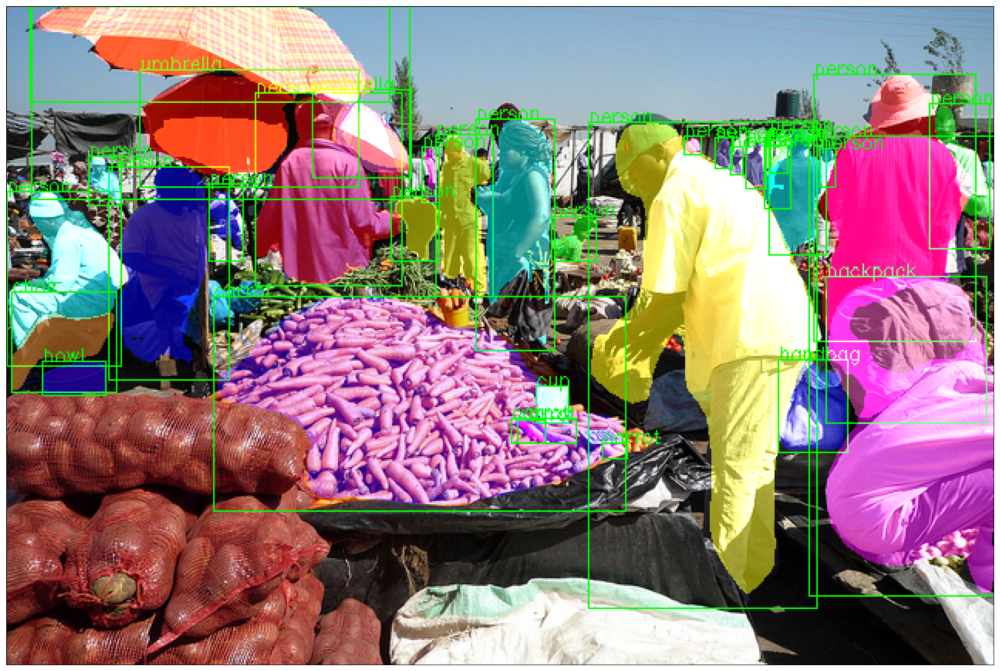

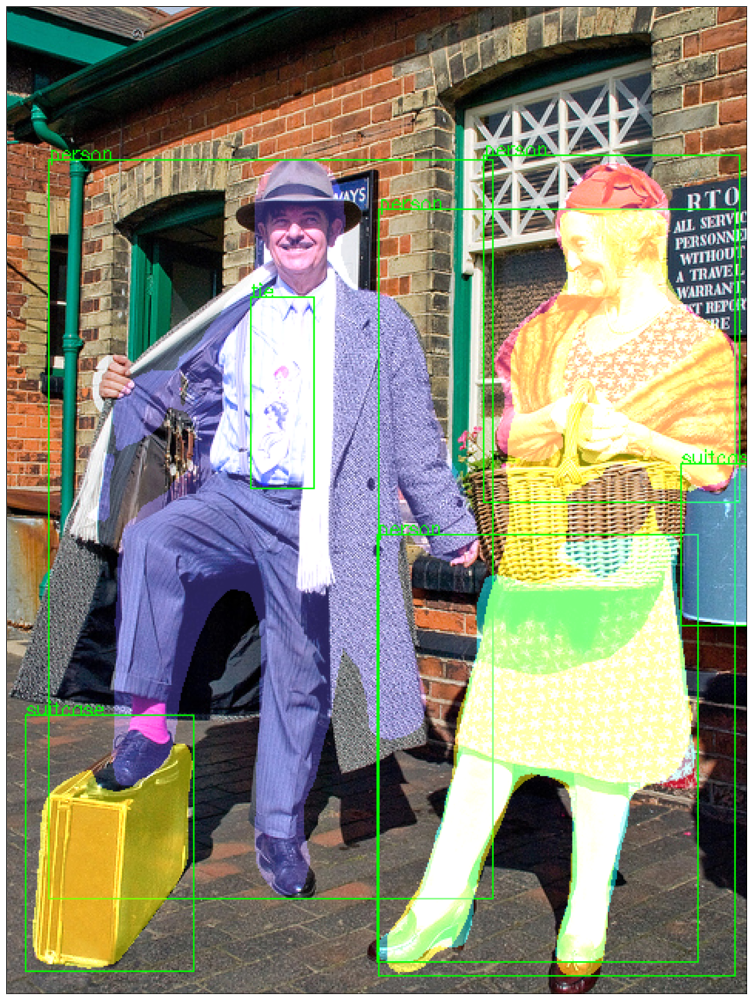

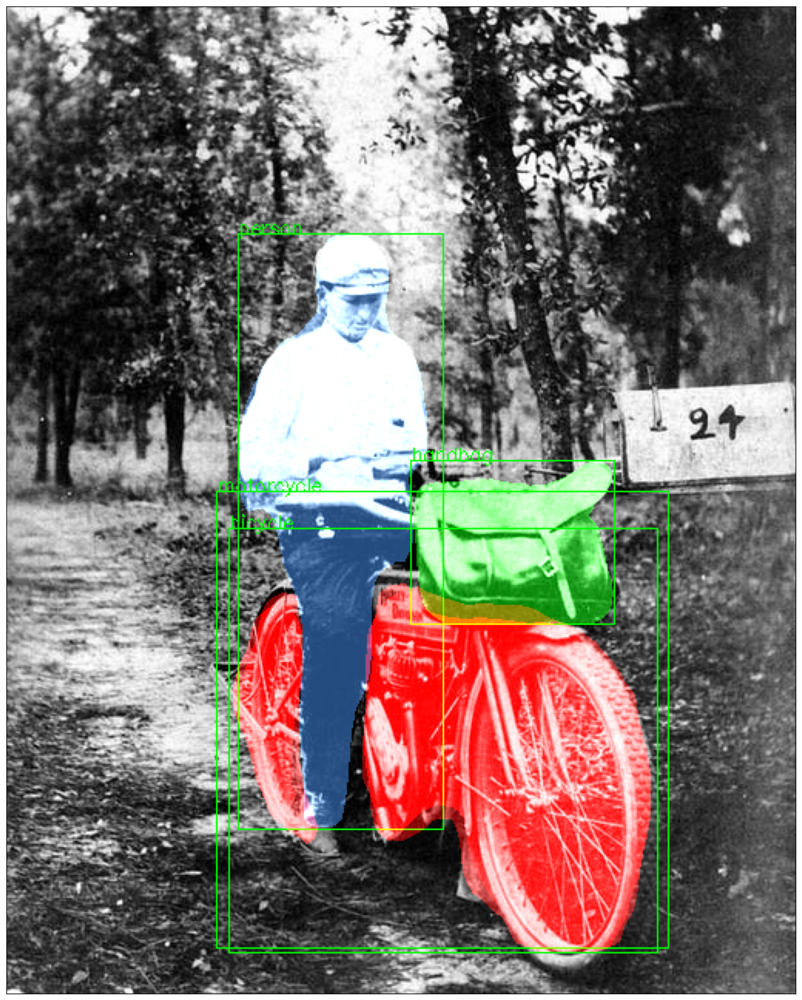

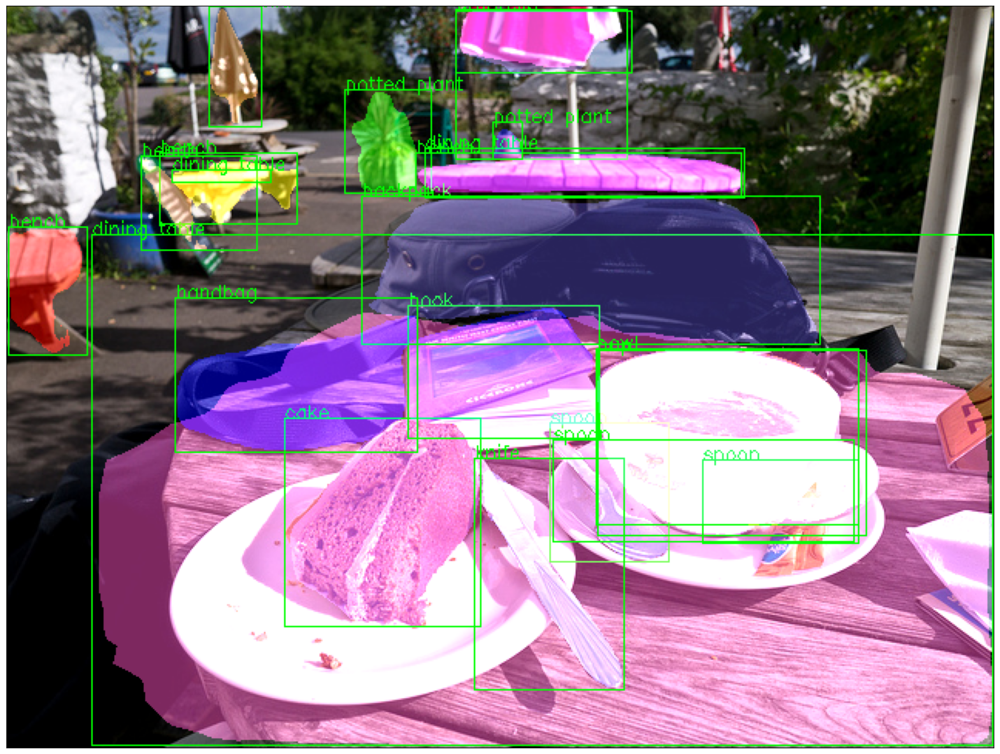

In [ ]:
# visualization after prediction
images_folder = f'{os.getcwd()}/person'
images_list = os.listdir(images_folder)
for idx in range(0, len(images_list), 15):
  instance_segmentation_api(f'{images_folder}/{images_list[idx]}')